In [31]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import seaborn as sns
import matplotlib.ticker as ticker
import itertools
import datetime
from collections import Counter

from imblearn.over_sampling import RandomOverSampler, SMOTE

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches

sns.set_style('whitegrid')

%matplotlib inline

In [32]:
# Read credit card fraud data
cc_fraud = pd.read_csv('creditcard.csv')
print("Number of instances: %d" % cc_fraud.shape[0])
print("Number of features: %d" % cc_fraud.shape[1])
cc_fraud.head()

Number of instances: 284807
Number of features: 31


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [33]:
cc_fraud.dtypes

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

In [34]:
# Missing values
na_perc = {}
for col in cc_fraud.columns:
    na_perc[col] = cc_fraud[col].isnull().sum()*100/len(cc_fraud)
na_perc

{'Time': 0.0,
 'V1': 0.0,
 'V2': 0.0,
 'V3': 0.0,
 'V4': 0.0,
 'V5': 0.0,
 'V6': 0.0,
 'V7': 0.0,
 'V8': 0.0,
 'V9': 0.0,
 'V10': 0.0,
 'V11': 0.0,
 'V12': 0.0,
 'V13': 0.0,
 'V14': 0.0,
 'V15': 0.0,
 'V16': 0.0,
 'V17': 0.0,
 'V18': 0.0,
 'V19': 0.0,
 'V20': 0.0,
 'V21': 0.0,
 'V22': 0.0,
 'V23': 0.0,
 'V24': 0.0,
 'V25': 0.0,
 'V26': 0.0,
 'V27': 0.0,
 'V28': 0.0,
 'Amount': 0.0,
 'Class': 0.0}

Text(0.5, 1.0, 'Correlation heatmap for the features')

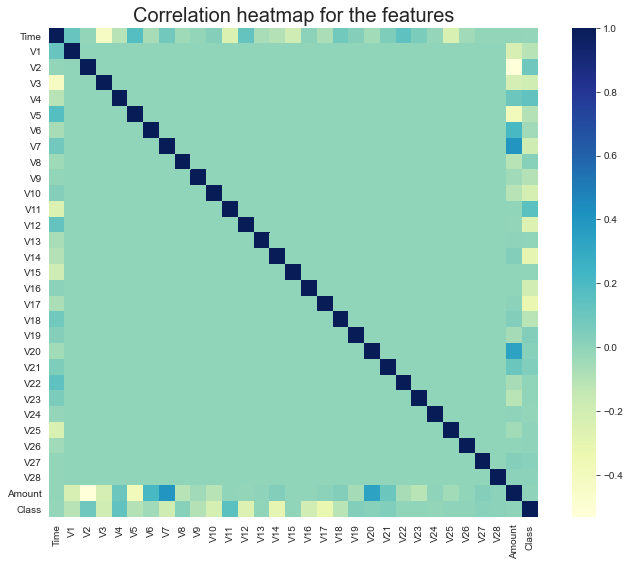

In [35]:
# Feature correlations - ideally should be uncorrelated since they are different components from PCA
corrmat = cc_fraud.corr()

f, ax = plt.subplots(figsize=(12, 9))

sns.heatmap(corrmat, square = True, cmap = 'YlGnBu')
plt.title('Correlation heatmap for the features', fontsize=20)

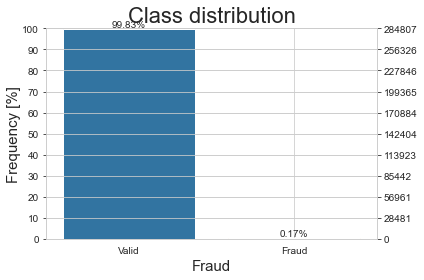

In [36]:
# Class distribution
map_dict = {0:"Valid", 1:"Fraud"}
cc_fraud['Class'] = cc_fraud['Class'].map(map_dict)
ncount = len(cc_fraud)

plt.figure()
sns.set_context({"figure.figsize": (15, 15)})
g = sns.countplot(x = 'Class', data = cc_fraud)
#g.set_xticklabels(labels,rotation = 90)
plt.title("Class distribution", fontsize=22)
g.set_xlabel('Fraud', fontsize=15)
g.set_ylabel('Frequency [%]', fontsize=15, labelpad=25)
g.axes.grid('off')

g2 = g.twinx()
g2.yaxis.tick_left()
g.yaxis.tick_right()

for p in g.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    g.annotate('{:.2f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

g.yaxis.set_major_locator(ticker.LinearLocator(11))

# Fix the frequency range to 0-100
g2.set_ylim(0,100)
g.set_ylim(0,ncount)

# And use a MultipleLocator to ensure a tick spacing of 10
g2.yaxis.set_major_locator(ticker.MultipleLocator(10))
g2.set_ylabel('', fontsize=15, labelpad=25)
g2.axes.grid('off')
plt.tight_layout()

(array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05,
        1.e+06]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

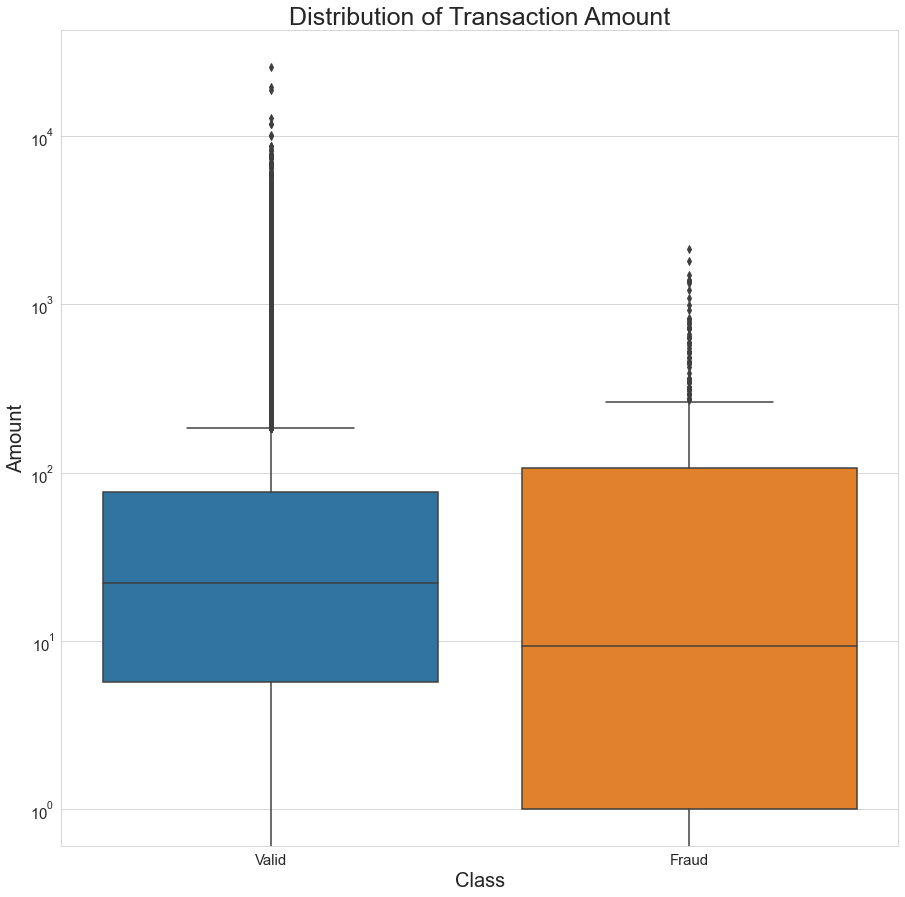

In [37]:
# Analysis of fraud by the total amount spent
plt.figure()
plt.yscale('log')
sns.set_context({"figure.figsize": (10, 8)})
g = sns.boxplot(data = cc_fraud, x = 'Class', y = 'Amount')
plt.title("Distribution of Transaction Amount", fontsize=25)
plt.xlabel('Class', fontsize=20); plt.xticks(fontsize=15)
plt.ylabel('Amount', fontsize=20); plt.yticks(fontsize=15)

(array([-250.,    0.,  250.,  500.,  750., 1000., 1250., 1500., 1750.,
        2000., 2250.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

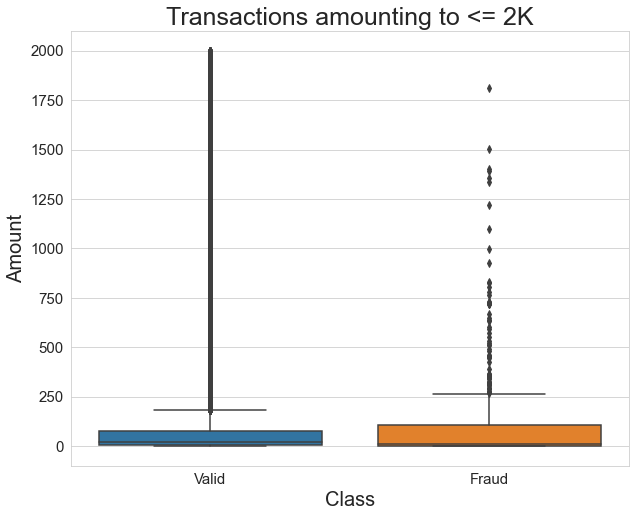

In [38]:
# Transactions less than 2K
plt.figure()
sns.set_context({"figure.figsize": (10, 8)})
g = sns.boxplot(data=cc_fraud.loc[cc_fraud.Amount <= 2000,:], x = 'Class', y = 'Amount')
plt.title("Transactions amounting to <= 2K", fontsize=25)
plt.xlabel('Class', fontsize=20); plt.xticks(fontsize=15)
plt.ylabel('Amount', fontsize=20); plt.yticks(fontsize=15)

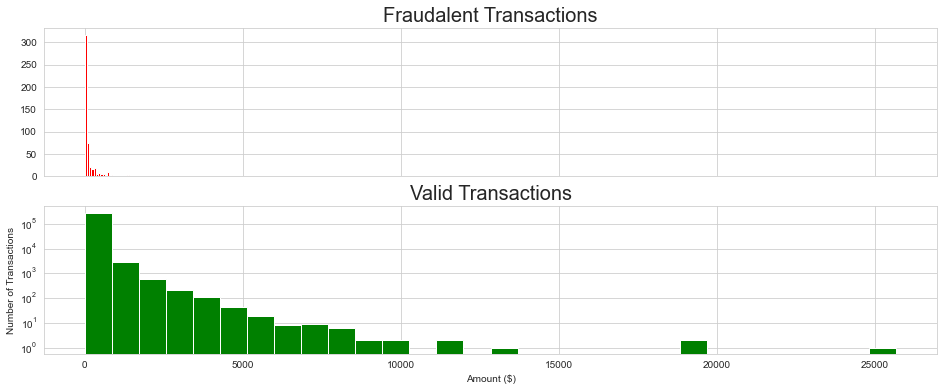

In [39]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(16,6))


ax1.hist(cc_fraud.Amount[cc_fraud.Class == 'Fraud'], bins = 30, color='red')
ax1.set_title('Fraudalent Transactions', fontsize=20)

ax2.hist(cc_fraud.Amount[cc_fraud.Class == 'Valid'], bins = 30, color='green')
ax2.set_title('Valid Transactions', fontsize=20)

plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()

In [40]:
cc_fraud.loc[cc_fraud.Amount==0,:].Class.value_counts()*100/cc_fraud.shape[0]
#Of the all the transactions, 0.63% of the transactions with no transaction amount are valid whereas 0.009% of the transactions with no transaction amount are fraudelent. Is it possible to have fraudelent transactions with no transaction amount? You may argue that a thief would actually do his work! So in that sense, the row entries could be data entry errors. However, this is possible in the real world that a transaction may amount to 0.

Valid    0.631305
Fraud    0.009480
Name: Class, dtype: float64

In [41]:
def convert_time(sec):
    return datetime.datetime.fromtimestamp(sec)

cc_fraud_time = cc_fraud[['Time','Amount','Class']].copy()
cc_fraud_time['time'] = cc_fraud_time.Time.apply(convert_time)
timeDelta = datetime.datetime.utcnow() - datetime.datetime.now() 
cc_fraud_time['hour'] = cc_fraud_time.time + timeDelta
cc_fraud_time['hour'] = cc_fraud_time.hour.dt.hour
cc_fraud_time_grouped = cc_fraud_time.groupby(['hour','Class'])

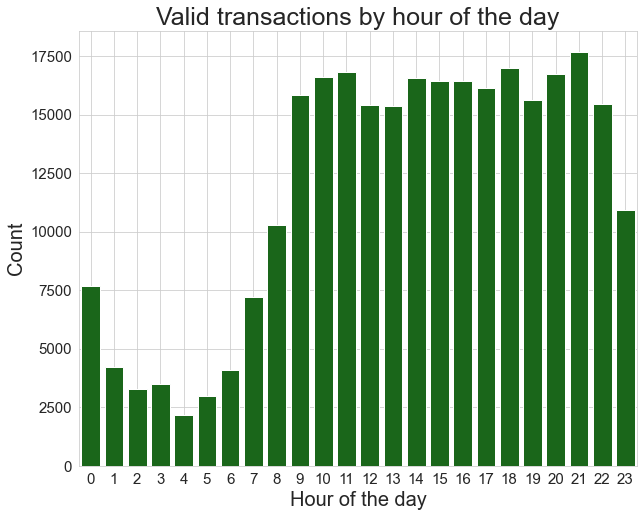

In [42]:
plt.figure()
sns.set_context({"figure.figsize": (10, 8)})
g = sns.countplot(data = cc_fraud_time[cc_fraud_time.Class == 'Valid'], x = 'hour', color = 'green',
                 saturation = 0.6)
plt.title("Valid transactions by hour of the day", fontsize=25)
plt.xlabel('Hour of the day', fontsize=20);plt.xticks(fontsize=15)
plt.ylabel('Count', fontsize=20);plt.yticks(fontsize=15)
g.axes.grid('off')

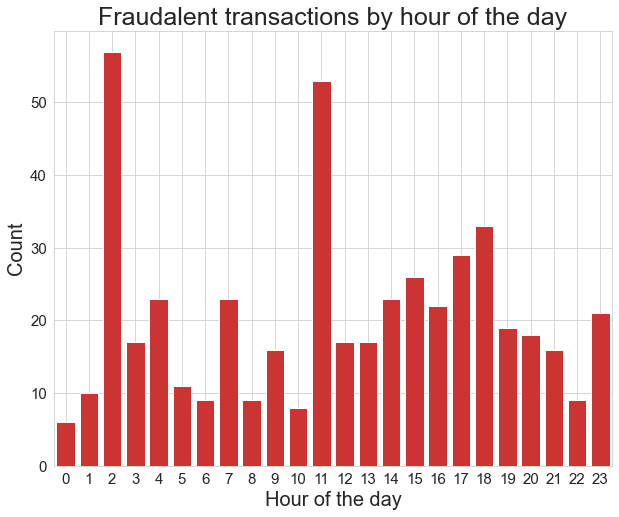

In [43]:
plt.figure()
sns.set_context({"figure.figsize": (10, 8)})
g = sns.countplot(data = cc_fraud_time[cc_fraud_time.Class == 'Fraud'], x = 'hour', color = 'red',
                 saturation = 0.6)
plt.title("Fraudalent transactions by hour of the day", fontsize=25)
plt.xlabel('Hour of the day',fontsize=20);plt.xticks(fontsize=15)
plt.ylabel('Count', fontsize=20);plt.yticks(fontsize=15)
plt.ylabel('Count')
g.axes.grid('off')

C:\Users\dasav\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dasav\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dasav\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

<Figure size 720x576 with 0 Axes>

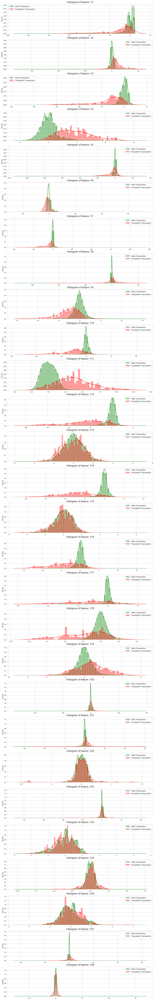

In [49]:
plt.clf()
pca_features = cc_fraud.columns[1:29]
plt.figure(figsize=(16,28*4))
gs = gridspec.GridSpec(28, 1)
for i, col in enumerate(cc_fraud[pca_features]):
    ax = plt.subplot(gs[i])
    sns.distplot(cc_fraud[col][cc_fraud.Class == 'Valid'], bins=50, label='Valid Transaction', color='green')
    sns.distplot(cc_fraud[col][cc_fraud.Class == 'Fraud'], bins=50, label='Fraudelent Transaction', color='red')
    ax.set_xlabel('')
    ax.set_title('Histogram of feature: ' + str(col),fontsize=15)
    plt.legend(loc='best',fontsize=12)
plt.show()